In [262]:
# import torch
# from torch.utils.data import Dataset
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import QuantileTransformer



# class MadrigalDataset(Dataset):
#     def __init__(self, config, normalize=False):
#         print("Loading Madrigal dataset with config:\n", config)
#         # Ensure all dataframes are sorted for merge_asof
#         self.data=pd.read_csv(config['madrigal_path'])
#         dates=pd.DatetimeIndex(self.data['all__dates_datetime__'].values)
#         self.data['all__dates_datetime__']=dates
#         self.data = self.data.sort_values('all__dates_datetime__').reset_index(drop=True)
#         print("Madrigal data loaded with shape:", self.data.shape)
#         print("Now removing 0 TEC values...")
#         self.data=self.data[self.data['madrigal__tec__[TECU]'].values>0]
#         self.data.reset_index(drop=True, inplace=True)
#         print("Madrigal data processed, final shape:", self.data.shape)

#         # Merge using backward merge_asof
#         print("\nLoading Celestrack data...")
#         celestrack_data=pd.read_csv(config['celestrack_path'])
#         celestrack_data['all__dates_datetime__']=pd.DatetimeIndex(celestrack_data['all__dates_datetime__'])
#         celestrack_data = celestrack_data.sort_values('all__dates_datetime__').reset_index(drop=True)
#         print("Celestrack data loaded with shape:", celestrack_data.shape)
#         print("Merging Madrigal and Celestrack data...")
#         self.data = pd.merge_asof(self.data, celestrack_data, on='all__dates_datetime__', direction='backward')
#         print("Merged data shape after Celestrack:", self.data.shape)

#         print("\nLoading SET data...")
#         set_sw=pd.read_csv(config['set_sw_path'])
#         set_sw['all__dates_datetime__']=pd.DatetimeIndex(set_sw['all__dates_datetime__'])
#         set_sw = set_sw.sort_values('all__dates_datetime__').reset_index(drop=True)
#         print("SET data loaded with shape:", set_sw.shape)
#         print("Merging Madrigal and SET data...")
#         self.data = pd.merge_asof(self.data, set_sw, on='all__dates_datetime__', direction='backward')
#         print("Merged data shape after SET:", self.data.shape)

#         self.omni_features = []
#         self.omni_scaler = {}
#         if (config['use_omni_indices'] or config['use_omni_magnetic_field'] or config['use_omni_solar_wind']) is True:
#             if config['use_omni_indices'] is True:
#                 print("\nLoading OMNI indices data...")
#                 omni_indices=pd.read_csv(config['omni_indices_path'])
#                 omni_indices['all__dates_datetime__']=pd.DatetimeIndex(omni_indices['all__dates_datetime__'])
#                 omni_indices = omni_indices.sort_values('all__dates_datetime__').reset_index(drop=True)
#                 print("OMNI indices data loaded with shape:", omni_indices.shape)
#                 print("Merging Madrigal and OMNI indices data...")
#                 self.data = pd.merge_asof(self.data, omni_indices, on='all__dates_datetime__', direction='backward')
#                 self.omni_features += omni_indices.columns.tolist()
#                 print("Merged data shape after OMNI indices:", self.data.shape)
#                 if normalize:
#                     print("\nNormalizing OMNI indices features with QuantileTransformer...")
#                     omni_indices_cols = [col for col in omni_indices.columns if col not in ['all__dates_datetime__', 'source__gaps_flag__']]
#                     omni_scaler = QuantileTransformer(
#                         n_quantiles=min(10_000, len(self.data[omni_indices_cols])),  # quantiles capped by dataset size
#                         output_distribution='normal',
#                         subsample=int(1e9),                       # disables subsampling
#                         random_state=42                           # reproducibility (even if subsampling were used)
#                     )
#                     self.omni_scaler['omni_magnetic_field'] = omni_scaler.fit(self.data[omni_indices_cols])
#                     self.data[omni_indices_cols] = omni_scaler.transform(self.data[omni_indices_cols])

#             if config['use_omni_magnetic_field'] is True:
#                 print("\nLoading OMNI magnetic field data...")
#                 omni_magnetic_field=pd.read_csv(config['omni_magnetic_field_path'])
#                 omni_magnetic_field['all__dates_datetime__']=pd.DatetimeIndex(omni_magnetic_field['all__dates_datetime__'])
#                 omni_magnetic_field = omni_magnetic_field.sort_values('all__dates_datetime__').reset_index(drop=True)
#                 print("OMNI magnetic field data loaded with shape:", omni_magnetic_field.shape)
#                 print("Merging Madrigal and OMNI magnetic field data...")
#                 self.data = pd.merge_asof(self.data, omni_magnetic_field, on='all__dates_datetime__', direction='backward')
#                 self.omni_features += omni_magnetic_field.columns.tolist()
#                 print("Merged data shape after OMNI magnetic field:", self.data.shape)
#                 if normalize:
#                     print("\nNormalizing OMNI magnetic field features with QuantileTransformer...")
#                     omni_magnetic_field_cols = [col for col in omni_magnetic_field.columns if col not in ['all__dates_datetime__', 'source__gaps_flag__']]
#                     omni_scaler = QuantileTransformer(
#                         n_quantiles=min(10_000, len(self.data[omni_magnetic_field_cols])),  # quantiles capped by dataset size
#                         output_distribution='normal',
#                         subsample=int(1e9),                       # disables subsampling
#                         random_state=42                           # reproducibility (even if subsampling were used)
#                     )
#                     self.omni_scaler['omni_magnetic_field'] = omni_scaler.fit(self.data[omni_magnetic_field_cols])
#                     self.data[omni_magnetic_field_cols] = omni_scaler.transform(self.data[omni_magnetic_field_cols])

#             if config['use_omni_solar_wind'] == False:
#                 print("\nLoading OMNI solar wind data...")
#                 omni_solar_wind=pd.read_csv(config['omni_solar_wind_path']) 
#                 omni_solar_wind['all__dates_datetime__']=pd.DatetimeIndex(omni_solar_wind['all__dates_datetime__'])
#                 omni_solar_wind = omni_solar_wind.sort_values('all__dates_datetime__').reset_index(drop=True)
#                 print("OMNI solar wind data loaded with shape:", omni_solar_wind.shape)
#                 print("Merging Madrigal and OMNI solar wind data...")
#                 self.data = pd.merge_asof(self.data, omni_solar_wind, on='all__dates_datetime__', direction='backward')
#                 self.omni_features += omni_solar_wind.columns.tolist()
#                 print("Merged data shape after OMNI solar wind:", self.data.shape)

#                 if normalize:
#                     print("\nNormalizing OMNI solar wind features with QuantileTransformer...")
#                     omni_solar_wind_cols = [col for col in omni_solar_wind.columns if col not in ['all__dates_datetime__', 'source__gaps_flag__']]
#                     omni_scaler = QuantileTransformer(
#                         n_quantiles=min(10_000, len(self.data[omni_solar_wind_cols])),  # quantiles capped by dataset size
#                         output_distribution='normal',
#                         subsample=int(1e9),                       # disables subsampling
#                         random_state=42                           # reproducibility (even if subsampling were used)
#                     )
#                     self.omni_scaler['omni_solar_wind'] = omni_scaler.fit(self.data[omni_solar_wind_cols])
#                     self.data[omni_solar_wind_cols] = omni_scaler.transform(self.data[omni_solar_wind_cols])

#         # Final sort and cleanup
#         self.data.sort_values('all__dates_datetime__', inplace=True)
#         self.data.reset_index(drop=True, inplace=True)

#         ##### Normalization and Features Extraction #####
#         print("Extracting features and normalizing data...")

#         # Normalize OMNI columns
#         if normalize:
#             #let's start by normalizing
#             print("\nNormalizing OMNI features with QuantileTransformer...")
#             if len(self.omni_features) == 0:
#                 omni_cols = [col for col in self.omni_features if col not in ['all__dates_datetime__', 'source__gaps_flag__']]
#                 # scaler = QuantileTransformer(n_quantiles=10_000, output_distribution='normal', subsample=int(1e9), random_state=42)
#                 # self.data[omni_cols] = scaler.fit_transform(self.data[omni_cols])
#                 omni_scaler = QuantileTransformer(
#                     n_quantiles=min(10_000, len(self.data[omni_cols])),  # quantiles capped by dataset size
#                     output_distribution='normal',
#                     subsample=int(1e9),                       # disables subsampling
#                     random_state=42                           # reproducibility (even if subsampling were used)
#                 )
#                 self.omni_scaler[omni_cols] = omni_scaler
#                 self.data[omni_cols] = self.omni_scaler.fit_transform(self.data[omni_cols])

#         # Extract date and features
#         self.input_features=[]
#         self.input_features_names = []
#         dt=self.data['all__dates_datetime__'].dt
#         #day of the year:
#         self.doy=torch.tensor(dt.dayofyear,dtype=torch.float32)
#         feature_as_radian = (2* np.pi * (self.doy-1.)/ (366. - 1.))
#         self.input_features.append(feature_as_radian.sin())
#         self.input_features.append(feature_as_radian.cos())
#         self.input_features_names += ['doy_sin', 'doy_cos']
#         #seconds in day:
#         self.sid = torch.tensor(dt.hour * 3600 + dt.minute * 60 + dt.second + dt.microsecond / 1e6,dtype=torch.float32)
#         feature_as_radian = (2* np.pi * (self.sid-0.)/ (86400. - 0.))
#         self.input_features.append(feature_as_radian.sin())
#         self.input_features.append(feature_as_radian.cos())
#         self.input_features_names += ['sid_sin', 'sid_cos']
#         #now the latitude:
#         self.latitudes = torch.tensor(np.deg2rad(self.data['all__latitudes__[deg]'].values), dtype=torch.float32)
#         self.input_features.append( 2 * (self.latitudes - (-np.pi/2)) / (np.pi/2 - (-np.pi/2)) - 1)
#         self.input_features_names += ['latitudes_normalized']
#         #self.latitudes_normalized = 2 * (self.latitudes - (-np.pi/2)) / (np.pi/2 - (-np.pi/2)) - 1
#         #now the longitude using sine/cosine:
#         self.longitudes = torch.tensor(np.deg2rad(self.data['all__longitudes__[deg]'].values), dtype=torch.float32)
#         self.input_features.append(self.longitudes.sin())
#         self.input_features.append(self.longitudes.cos())
#         self.input_features_names += ['longitudes_sin', 'longitudes_cos']

#         #now SET F10.7, M10.7, S10.7, Y10.7:
#         self.data_set=[]
#         for col in self.data.columns:
#             if col.startswith('space_environment_technologies__'):
#                 self.input_features_names+=[col+'log1p_normalized']
#                 tmp=np.log1p(self.data[col].values)
#                 tmp=(tmp-4.71)/0.4
#                 self.input_features.append(torch.tensor(tmp, dtype=torch.float32))

#         #now celestrack:
#         #(np.float64(2.0313533113439646), np.float64(0.6991548283084174))
#         self.ap_average=self.data['celestrack__ap_average__'].values
#         self.input_features.append(torch.tensor((np.log1p(self.ap_average)-2.03)/0.7, dtype=torch.float32))
#         self.input_features_names += ['ap_average_log1p_normalized']

#         self.dates = self.data['all__dates_datetime__'].values

#         self.input_features = torch.stack(self.input_features).T
#         print("Input features shape:", self.input_features.shape)
#         self.tec = torch.tensor((np.log1p(self.data['madrigal__tec__[TECU]'].values)-2.34)/0.82, dtype=torch.float32)
#         self.dtec = torch.tensor(self.data['madrigal__dtec__[TECU]'].values, dtype=torch.float32)

#         #classify solar activity levels according to F10.7 values:
#         solar_activity_bins_classification={0:'F10.7: 0-70 (low)',
#                                             1:'F10.7: 70-150 (moderate)',
#                                             2:'F10.7: 150-200 (moderate-high)',
#                                             3:'F10.7: 200 (high)'}
#         solar_activity_bins = np.array([0, 70, 150, 200, 1000])
#         solar_activity_classification = np.digitize(set_sw['space_environment_technologies__f107_obs__'].values, solar_activity_bins)-1
#         self.solar_activity_classification = [solar_activity_bins_classification[v] for v in solar_activity_classification]

#         #geomagnetic storm condition, in G-classes:
#         #source: https://www.spaceweatherlive.com/en/help/the-ap-index.html
#         #Kp             Ap         Storm Type
#         #[0-5-)       [0-39)       G0 
#         #[5-,6-)      [39-67)      G1
#         #[6-,7-)      [67,111)     G2
#         #[7-,8-)      [111,179)    G3
#         #[8-,9)       [179,300)    G4
#         #[9,9]        [300-400]    G5
#         ap_values_bins = np.array([0, 39, 67, 111, 179, 300, 400])
#         ap_values_classification={0:'G0', 
#                                   1:'G1', 
#                                   2:'G2', 
#                                   3:'G3', 
#                                   4:'G4', 
#                                   5:'G5'}
#         storm_classification = np.digitize(self.ap_average, ap_values_bins)-1
#         self.storm_classification = [ap_values_classification[v] for v in storm_classification]
#         self.ap_average = torch.tensor(self.ap_average, dtype=torch.float32)


#     def __len__(self):
#         return len(self.features)

#     def __getitem__(self, idx):
#         return {'date': self.dates[idx],
#                 'inputs': self.input_features[idx],
#                 'tec': self.tec[idx],
#                 'dtec': self.dtec[idx],
#                 'solar_activity_classification': self.solar_activity_classification[idx],
#                 'storm_classification': self.storm_classification[idx]}

In [48]:
import torch
from torch.utils.data import Dataset
import pandas as pd
import numpy as np
from sklearn.preprocessing import PowerTransformer
import math

TEC_MEAN_LOG1P = 2.34
TEC_STD_LOG1P = 0.82

DTEC_MEAN_LOG1P = 0.679265
DTEC_STD_LOG1P = 0.30878955

JPLD_MEAN_LOG1P = {'JPLD__vTEC_lat-89.5_lon0.50__[TECU]_MEAN_LOG1P': 1.82074894114097,
                    'JPLD__vTEC_lat-63.5_lon137.50__[TECU]_MEAN_LOG1P': 2.0359344662129404,
                    'JPLD__vTEC_lat-51.5_lon-84.50__[TECU]_MEAN_LOG1P': 2.4492743723312587,
                    'JPLD__vTEC_lat-42.5_lon52.50__[TECU]_MEAN_LOG1P': 2.124772779236437,
                    'JPLD__vTEC_lat-35.5_lon-169.50__[TECU]_MEAN_LOG1P': 2.576710664607376,
                    'JPLD__vTEC_lat-28.5_lon-32.50__[TECU]_MEAN_LOG1P': 2.5765730992351537,
                    'JPLD__vTEC_lat-21.5_lon104.50__[TECU]_MEAN_LOG1P': 2.584685797873827,
                    'JPLD__vTEC_lat-15.5_lon-117.50__[TECU]_MEAN_LOG1P': 3.119531883784697,
                    'JPLD__vTEC_lat-9.5_lon20.50__[TECU]_MEAN_LOG1P': 2.9281065535862063,
                    'JPLD__vTEC_lat-3.5_lon157.50__[TECU]_MEAN_LOG1P': 3.0796339163028117,
                    'JPLD__vTEC_lat3.5_lon-64.50__[TECU]_MEAN_LOG1P': 3.0977589812399198,
                    'JPLD__vTEC_lat9.5_lon72.50__[TECU]_MEAN_LOG1P': 3.043229097954339,
                    'JPLD__vTEC_lat15.5_lon-149.50__[TECU]_MEAN_LOG1P': 3.0486823395166196,
                    'JPLD__vTEC_lat21.5_lon-12.50__[TECU]_MEAN_LOG1P': 3.0485672585713335,
                    'JPLD__vTEC_lat28.5_lon124.50__[TECU]_MEAN_LOG1P': 2.90664915268121,
                    'JPLD__vTEC_lat35.5_lon-97.50__[TECU]_MEAN_LOG1P': 2.447662194290401,
                    'JPLD__vTEC_lat42.5_lon40.50__[TECU]_MEAN_LOG1P': 2.570092810420694,
                    'JPLD__vTEC_lat51.5_lon177.50__[TECU]_MEAN_LOG1P': 2.277713903614229,
                    'JPLD__vTEC_lat63.5_lon-44.50__[TECU]_MEAN_LOG1P': 1.982378034615702,
                    'JPLD__vTEC_lat89.5_lon179.50__[TECU]_MEAN_LOG1P': 1.939620091033355}

JPLD_STD_LOG1P = {'JPLD__vTEC_lat-89.5_lon0.50__[TECU]_STD_LOG1P': 0.8254521023035589,
                    'JPLD__vTEC_lat-63.5_lon137.50__[TECU]_STD_LOG1P': 0.8287758266248253,
                    'JPLD__vTEC_lat-51.5_lon-84.50__[TECU]_STD_LOG1P': 0.6176087881155107,
                    'JPLD__vTEC_lat-42.5_lon52.50__[TECU]_STD_LOG1P': 0.8792134050940251,
                    'JPLD__vTEC_lat-35.5_lon-169.50__[TECU]_STD_LOG1P': 0.5404825872117722,
                    'JPLD__vTEC_lat-28.5_lon-32.50__[TECU]_STD_LOG1P': 0.8507748232421296,
                    'JPLD__vTEC_lat-21.5_lon104.50__[TECU]_STD_LOG1P': 0.6512105121017336,
                    'JPLD__vTEC_lat-15.5_lon-117.50__[TECU]_STD_LOG1P': 0.7512934432397286,
                    'JPLD__vTEC_lat-9.5_lon20.50__[TECU]_STD_LOG1P': 0.7696478118311895,
                    'JPLD__vTEC_lat-3.5_lon157.50__[TECU]_STD_LOG1P': 0.7152521533223408,
                    'JPLD__vTEC_lat3.5_lon-64.50__[TECU]_STD_LOG1P': 0.7482667810243686,
                    'JPLD__vTEC_lat9.5_lon72.50__[TECU]_STD_LOG1P': 0.774847786159427,
                    'JPLD__vTEC_lat15.5_lon-149.50__[TECU]_STD_LOG1P': 0.7832485541481462,
                    'JPLD__vTEC_lat21.5_lon-12.50__[TECU]_STD_LOG1P': 0.7679581425187447,
                    'JPLD__vTEC_lat28.5_lon124.50__[TECU]_STD_LOG1P': 0.6322272003760236,
                    'JPLD__vTEC_lat35.5_lon-97.50__[TECU]_STD_LOG1P': 0.6090025501268901,
                    'JPLD__vTEC_lat42.5_lon40.50__[TECU]_STD_LOG1P': 0.5247271819911848,
                    'JPLD__vTEC_lat51.5_lon177.50__[TECU]_STD_LOG1P': 0.5985722252723569,
                    'JPLD__vTEC_lat63.5_lon-44.50__[TECU]_STD_LOG1P': 0.6955299120749504,
                    'JPLD__vTEC_lat89.5_lon179.50__[TECU]_STD_LOG1P': 0.7287565211357849}

class MadrigalDatasetTimeSeries(Dataset):
    def __init__(self, 
                config, 
                torch_type,
                min_date=pd.to_datetime("2010-06-13 00:00:00"),
                max_date=pd.to_datetime("2024-07-31 23:45:00"),
                normalize=False):

        self.min_date = min_date
        self.max_date = max_date
        print("\nMadrigalDatasetTimeSeries initialized with min_date:", self.min_date, "and max_date:", self.max_date)
        self.time_series_data = {}
        self.config = config
        self.torch_type = torch_type
        self.features = []
        # self.min_date = min_date
        # self.max_date = max_date

        print("Loading Madrigal dataset with config:\n", config)
        # Ensure all dataframes are sorted for merge_asof
        self.data=pd.read_csv(config['madrigal_path'])
        self.data = self.data[(pd.to_datetime(self.data['all__dates_datetime__'])>=self.min_date) & (pd.to_datetime(self.data['all__dates_datetime__'])<=self.max_date)]
        self.data.reset_index(drop=True, inplace=True)
        dates=pd.DatetimeIndex(self.data['all__dates_datetime__'].values)
        self.data['all__dates_datetime__']=dates
        self.data = self.data.sort_values('all__dates_datetime__').reset_index(drop=True)
        print("Madrigal data loaded with shape:", self.data.shape)
        print("Now removing 0 TEC values...")
        self.data=self.data[self.data['madrigal__tec__[TECU]'].values>0]
        self.data.reset_index(drop=True, inplace=True)
        print("Madrigal data processed, final shape:", self.data.shape)

        # Final sort and cleanup
        self.data.sort_values('all__dates_datetime__', inplace=True)
        self.data.reset_index(drop=True, inplace=True)

        ##### Normalization and Features Extraction #####

        # Extract date and features
        self.input_features=[]
        self.input_features_names = []
        dt=self.data['all__dates_datetime__'].dt
        #day of the year:
        self.doy=torch.tensor(dt.dayofyear,dtype=torch.float32)
        feature_as_radian = (2* np.pi * (self.doy-1.)/ (366. - 1.))
        self.input_features.append(feature_as_radian.sin())
        self.input_features.append(feature_as_radian.cos())
        self.input_features_names += ['doy_sin', 'doy_cos']
        #seconds in day:
        self.sid = torch.tensor(dt.hour * 3600 + dt.minute * 60 + dt.second + dt.microsecond / 1e6,dtype=torch.float32)
        feature_as_radian = (2.* np.pi * (self.sid-0.)/ (86400. - 0.))
        self.input_features.append(feature_as_radian.sin())
        self.input_features.append(feature_as_radian.cos())
        self.input_features_names += ['sid_sin', 'sid_cos']
        #now the latitude:
        self.latitudes = torch.tensor(np.deg2rad(self.data['all__latitudes__[deg]'].values), dtype=torch.float32)
        self.input_features.append( 2 * (self.latitudes - (-np.pi/2)) / (np.pi/2 - (-np.pi/2)) - 1)
        self.input_features_names += ['latitudes_normalized']
        #self.latitudes_normalized = 2 * (self.latitudes - (-np.pi/2)) / (np.pi/2 - (-np.pi/2)) - 1
        #now the longitude using sine/cosine:
        self.longitudes = torch.tensor(np.deg2rad(self.data['all__longitudes__[deg]'].values), dtype=torch.float32)
        self.input_features.append(self.longitudes.sin())
        self.input_features.append(self.longitudes.cos())
        self.input_features_names += ['longitudes_sin', 'longitudes_cos']

        self.min_date = self.data['all__dates_datetime__'].min()
        self.max_date = self.data['all__dates_datetime__'].max()

        self.dates = self.data['all__dates_datetime__'].values


        self.input_features = torch.stack(self.input_features).T
        print("Input features shape:", self.input_features.shape)
        self.tec = torch.tensor((np.log1p(self.data['madrigal__tec__[TECU]'].values)-TEC_MEAN_LOG1P)/TEC_STD_LOG1P, dtype=torch.float32)
        self.dtec = torch.tensor(np.log1p(self.data['madrigal__dtec__[TECU]'].values), dtype=torch.float32)
        #we replace to the NaN of the DTEC the median (e.g. if the std is not known, the median std over the whole thing is used)
        self.dtec[torch.isnan(self.dtec)]=torch.median(self.dtec[~torch.isnan(self.dtec)])
        #let's now normalize the dtec:
        self.dtec = (self.dtec - DTEC_MEAN_LOG1P) / DTEC_STD_LOG1P

        # Add time series data here.            
        if config["use_jpld"] is not None:
            print("Loading JPLD dataset.")
            self._add_time_series_data(
                "jpld",
                config["jpld_path"],
                config['lag_minutes_jpld'],
                config['jpld_resolution'],
                ["all__dates_datetime__"],
            )
        if config["use_omni_indices"] is not None:
            print("Loading Omni indices.")
            self._add_time_series_data(
                "omni_indices",
                config["omni_indices_path"],
                config['lag_minutes_omni'],
                config['omni_resolution'],
                ["all__dates_datetime__", "source__gaps_flag__", "omniweb__ae_index__[nT]", "omniweb__al_index__[nT]", "omniweb__au_index__[nT]"],
            )
        if config['use_omni_solar_wind'] is not None:
            print("Loading Omni Solar Wind.")
            self._add_time_series_data(
                "omni_solar_wind",
                config["omni_solar_wind_path"],
                config['lag_minutes_omni'],
                config['omni_resolution'],
                ["all__dates_datetime__", "source__gaps_flag__"],
            )
        if config['use_omni_magnetic_field'] is not None:
            print("Loading Omni Magnetic Field.")
            self._add_time_series_data(
                "omni_magnetic_field",
                config["omni_magnetic_field_path"],
                config['lag_minutes_omni'],
                config['omni_resolution'],
                ["all__dates_datetime__", "source__gaps_flag__"],
            )

        if config["set_sw_path"] is not None:
            print("Loading SET Solar Wind data.")
            self._add_time_series_data(
                "set_sw",
                config["set_sw_path"],
                config['lag_days_proxies'],
                config['proxies_resolution'],
                ["all__dates_datetime__"],
            )
        
        if config["celestrack_path"] is not None:
            print("Loading Celestrack data.")
            self._add_time_series_data(
                "celestrack",
                config["celestrack_path"],
                config['lag_days_proxies'],
                config['proxies_resolution'],
                ["all__dates_datetime__"],
            )
        
    def _add_time_series_data(self, 
                              data_name, 
                              data_path, 
                              lag, 
                              resolution, 
                              excluded_features):
        # Data loading:
        self.time_series_data[data_name] = {}
        if data_name in ["omni_indices", "omni_solar_wind", "omni_magnetic_field", "jpld"]:
            print("\nLoading time series data for", data_name)
            self.time_series_data[data_name]["data"] = pd.read_csv(data_path)
            self.time_series_data[data_name]["data"]['all__dates_datetime__'] = pd.DatetimeIndex(self.time_series_data[data_name]["data"]['all__dates_datetime__'])
            # we now index the data by the datetime column, and sort it by the index. The reason is that it is then easier to resample

            # We exclude the columns that are not needed for the model.
            print("Normalizing time series data for", data_name)
            # This is to remove significant outliers, such as the fism2 flare data which has 10^45 photons at one point. Regardless
            # of whther this is true or not, it severely affects the distribution.
            # We replace NaNs and +/-inf by interpolating them away.
            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].replace([np.inf, -np.inf], None)
            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].dropna()
            self.time_series_data[data_name]["data"].index = pd.to_datetime(self.time_series_data[data_name]["data"]["all__dates_datetime__"])
            self.time_series_data[data_name]["data"].sort_index(inplace=True)
            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].drop(columns=excluded_features, axis=1)

            self.time_series_data[data_name]["data"] = (self.time_series_data[data_name]["data"].resample(f"{resolution}min").ffill())
            # self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"][
            #                                                                                     (self.time_series_data[data_name]["data"].index >= (self.min_date - pd.DateOffset(minutes=lag))) &
            #                                                                                     (self.time_series_data[data_name]["data"].index <= self.max_date)
            #                                                                                 ]
            # for column in self.time_series_data[data_name]["data"].columns:
            #     quantile = self.time_series_data[data_name]["data"][column].quantile(0.998)
            #     more_than = self.time_series_data[data_name]["data"][column] >= quantile
            #     self.time_series_data[data_name]["data"].loc[more_than, column] = None

            self.time_series_data[data_name]["date_start"] = min(self.time_series_data[data_name]["data"].index)
            self.time_series_data[data_name]["column_names"] = self.time_series_data[data_name]["data"].columns
            #let's apply the Yeo-Johnson transformation:
            self.time_series_data[data_name]["features_names"] = [f'{column}_yeojohnson_zscore' for column in self.time_series_data[data_name]["data"].columns]

            scaler = PowerTransformer(method='yeo-johnson', standardize=True)
            vals = self.time_series_data[data_name]["data"].values
            vals = scaler.fit_transform(vals)
            vals = torch.tensor(vals, dtype=self.torch_type)
            self.time_series_data[data_name]["data"] = vals

            self.time_series_data[data_name]["lag"] = lag

            self.time_series_data[data_name]["scaler"] = scaler
            self.time_series_data[data_name]["resolution"] = resolution
        elif data_name.startswith("set"):
            #now SET F10.7, M10.7, S10.7, Y10.7:
            tmp=pd.read_csv(data_path)
            self.time_series_data[data_name]["data"] = tmp
            self.time_series_data[data_name]["data"]["all__dates_datetime__"]=pd.DatetimeIndex(tmp['all__dates_datetime__'])
            self.time_series_data[data_name]["data"]['all__dates_datetime__'] = pd.DatetimeIndex(self.time_series_data[data_name]["data"]['all__dates_datetime__'])

            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].dropna()
            self.time_series_data[data_name]["data"].index = pd.to_datetime(self.time_series_data[data_name]["data"]["all__dates_datetime__"])
            self.time_series_data[data_name]["data"].sort_index(inplace=True)

            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].drop(columns=excluded_features, axis=1)
            self.time_series_data[data_name]["data"] = (self.time_series_data[data_name]["data"].resample(f"{resolution}D").ffill())
            # self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"][
            #                                                                                     (self.time_series_data[data_name]["data"].index >= (
            #                                                                                         self.min_date - pd.DateOffset(days=lag)
            #                                                                                     )) &
            #                                                                                     (self.time_series_data[data_name]["data"].index <= self.max_date)
            #                                                                                 ]
            f107_obs=self.time_series_data[data_name]["data"]['space_environment_technologies__f107_obs__'].values
            print("Normalizing time series data for", data_name)
            vals=[]
            for column in self.time_series_data[data_name]["data"].columns:
                vals.append(torch.tensor((np.log1p(self.time_series_data[data_name]["data"][column].values)-4.71)/0.4, dtype=torch.float32))
            #let's apply the Yeo-Johnson transformation:
            scaler = PowerTransformer(method='yeo-johnson', standardize=True)
            self.time_series_data[data_name]["column_names"] = self.time_series_data[data_name]["data"].columns
            #self.input_features_names += [f'{column}_log1p_normalized']

            self.time_series_data[data_name]["date_start"] = min(self.time_series_data[data_name]["data"].index)
            self.time_series_data[data_name]["column_names"] = self.time_series_data[data_name]["data"].columns
            #self.time_series_data[data_name]["data_matrix"] = self.time_series_data[data_name]["data"].values
            self.time_series_data[data_name]["features_names"] = [f'{column}_yeo' for column in self.time_series_data[data_name]["data"].columns]

            vals = self.time_series_data[data_name]["data"].values
            vals = scaler.fit_transform(vals)
            vals = torch.tensor(vals, dtype=self.torch_type)

            self.time_series_data[data_name]["data"]=vals
            self.time_series_data[data_name]["lag"] = lag
            self.time_series_data[data_name]["resolution"] = resolution
            self.time_series_data[data_name]["scaler"] = scaler

            #classify solar activity levels according to F10.7 values:
            solar_activity_bins_classification={0:'F10.7: 0-70 (low)',
                                                1:'F10.7: 70-150 (moderate)',
                                                2:'F10.7: 150-200 (moderate-high)',
                                                3:'F10.7: 200 (high)'}
            solar_activity_bins = np.array([0, 70, 150, 200, 1000])
            solar_activity_classification = np.digitize(f107_obs, solar_activity_bins)-1
            solar_activity_classification = [solar_activity_bins_classification[v] for v in solar_activity_classification]
            self.time_series_data[data_name]["solar_activity_classification"] = solar_activity_classification

        elif data_name.startswith("celestrack"):
            #ap average
            tmp=pd.read_csv(data_path)
            self.time_series_data[data_name]["data"] = tmp
            self.time_series_data[data_name]["data"]["all__dates_datetime__"]=pd.DatetimeIndex(tmp['all__dates_datetime__'])
            
            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].dropna()
            self.time_series_data[data_name]["data"].index = pd.to_datetime(self.time_series_data[data_name]["data"]["all__dates_datetime__"])
            self.time_series_data[data_name]["data"].sort_index(inplace=True)
            self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].drop(columns=excluded_features, axis=1)

            self.time_series_data[data_name]["data"] = (self.time_series_data[data_name]["data"].resample(f"{resolution}D").ffill())
            #let's remove the NaN:
            #self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"].replace([np.inf, -np.inf], None)
            # self.time_series_data[data_name]["data"] = self.time_series_data[data_name]["data"][
            #                                                                                     (self.time_series_data[data_name]["data"].index >= (
            #                                                                                         self.min_date - pd.DateOffset(days=lag)
            #                                                                                     )) &
            #                                                                                     (self.time_series_data[data_name]["data"].index <= self.max_date)
            #                                                                                 ]
            self.ap_average=self.time_series_data[data_name]["data"]['celestrack__ap_average__'].values

            #let's now 

            print("Normalizing time series data for", data_name)
            # vals=[]
            # for column in self.time_series_data[data_name]["data"].columns:
            #     vals.append(torch.tensor((np.log1p(self.time_series_data[data_name]["data"][column].values)-2.03)/0.7, dtype=torch.float32))
            #let's apply the Yeo-Johnson transformation:
            self.time_series_data[data_name]["date_start"] = min(self.time_series_data[data_name]["data"].index)
            self.time_series_data[data_name]["column_names"] = self.time_series_data[data_name]["data"].columns
            self.time_series_data[data_name]["features_names"] = [f'{column}_yeojohnson_zscore' for column in self.time_series_data[data_name]["data"].columns]

            scaler = PowerTransformer(method='yeo-johnson', standardize=True)
            vals = self.time_series_data[data_name]["data"].values
            vals = scaler.fit_transform(vals)
            vals = torch.tensor(vals, dtype=self.torch_type)

            self.time_series_data[data_name]["scaler"] = scaler
            self.time_series_data[data_name]["data"]=vals
            #self.input_features_names += [f'{column}_log1p_normalized']
            self.time_series_data[data_name]["lag"] = lag
            self.time_series_data[data_name]["resolution"] = resolution

            #self.time_series_data[data_name]["data_matrix"] = self.time_series_data[data_name]["data"].values

            ap_values_bins = np.array([0, 39, 67, 111, 179, 300, 4001])
            ap_values_classification={0:'G0', 
                                        1:'G1', 
                                        2:'G2', 
                                        3:'G3', 
                                        4:'G4', 
                                        5:'G5'}
            storm_classification = np.digitize(self.ap_average, ap_values_bins)-1
            storm_classification = [ap_values_classification[v] for v in storm_classification]
            ap_average = torch.tensor(self.ap_average, dtype=torch.float32)
            self.time_series_data[data_name]["storm_classification"] = storm_classification
            self.time_series_data[data_name]["ap_average"] = ap_average

    def date_to_index(self, date, date_start, resolution_seconds):
        delta = date - date_start
        index = int(delta.total_seconds() / resolution_seconds)
        return index
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample={}
        #sample["ap_average"] = self.ap_average[idx]
        sample["date"] = self.dates[idx]
        sample["inputs"] = self.input_features[idx]
        sample["tec"] = self.tec[idx]
        sample["dtec"] = self.dtec[idx]

        for data_name, data in self.time_series_data.items():
            ####IMPORTANT -> first row, is old data, last row is new data.
            #So sample[data_name][0,:] will contain the data at lagged_index time (older in time), while sample[data_name][-1,:] will contain the data at now_index time (newer in time).
            is_omni_or_jpl = "omni" in data_name or "jpld" in data_name

            resolution_seconds = data["resolution"] * 60 if is_omni_or_jpl else data["resolution"] * 24 * 3600
            lag = data["lag"]
            lag_timedelta = pd.Timedelta(minutes=lag) if is_omni_or_jpl else pd.Timedelta(days=lag)

            now_index = self.date_to_index(
                date=pd.to_datetime(sample['date']),
                date_start=data["date_start"],
                resolution_seconds=resolution_seconds
            )

            lagged_index = self.date_to_index(
                date=pd.to_datetime(sample['date']) - lag_timedelta,
                date_start=data["date_start"],
                resolution_seconds=resolution_seconds
            )

            sample[data_name] = data["data"][lagged_index : (now_index + 1), :]

        return sample

In [49]:
bucket_path='/home/ga00693/gcs-bucket/'
config={'madrigal_path': f'{bucket_path}/madrigal_data/processed/gps_data_tarr/csv_subsets/subset_tec_10mln.csv',
        'set_sw_path': f'{bucket_path}/karman-2025/data/sw_data/set_sw.csv',
        'celestrack_path': f'{bucket_path}/karman-2025/data/sw_data/celestrack_sw.csv',
        'omni_indices_path': f'{bucket_path}/karman-2025/data/omniweb_data/merged_omni_indices.csv',
        'omni_magnetic_field_path': f'{bucket_path}/karman-2025/data/omniweb_data/merged_omni_magnetic_field.csv',
        'omni_solar_wind_path': f'{bucket_path}/karman-2025/data/omniweb_data/merged_omni_solar_wind.csv',
        'jpld_path': f'{bucket_path}/jpld/subset_lat_lon/jpld_vtec_15min.csv',
        'use_celestrack': True,
        'use_set_sw': True,
        'use_jpld': True,
        'use_omni_indices': True,
        'use_omni_magnetic_field': True,
        'use_omni_solar_wind': True,
        'lag_days_proxies':81, # 81 days
        'proxies_resolution':1,  # 1 day
        'lag_minutes_omni':2 * 24 * 60,
        'omni_resolution':1,  # 1 minute
        'lag_minutes_jpld':150,
        'jpld_resolution':15,  # 15 minutes
}
madrigal_dataset = MadrigalDatasetTimeSeries(config,
                                             torch_type=torch.float32, 
                                             normalize=True)


MadrigalDatasetTimeSeries initialized with min_date: 2010-06-13 00:00:00 and max_date: 2024-07-31 23:45:00
Loading Madrigal dataset with config:
 {'madrigal_path': '/home/ga00693/gcs-bucket//madrigal_data/processed/gps_data_tarr/csv_subsets/subset_tec_10mln.csv', 'set_sw_path': '/home/ga00693/gcs-bucket//karman-2025/data/sw_data/set_sw.csv', 'celestrack_path': '/home/ga00693/gcs-bucket//karman-2025/data/sw_data/celestrack_sw.csv', 'omni_indices_path': '/home/ga00693/gcs-bucket//karman-2025/data/omniweb_data/merged_omni_indices.csv', 'omni_magnetic_field_path': '/home/ga00693/gcs-bucket//karman-2025/data/omniweb_data/merged_omni_magnetic_field.csv', 'omni_solar_wind_path': '/home/ga00693/gcs-bucket//karman-2025/data/omniweb_data/merged_omni_solar_wind.csv', 'jpld_path': '/home/ga00693/gcs-bucket//jpld/subset_lat_lon/jpld_vtec_15min.csv', 'use_celestrack': True, 'use_set_sw': True, 'use_jpld': True, 'use_omni_indices': True, 'use_omni_magnetic_field': True, 'use_omni_solar_wind': True, 

Madrigal data loaded with shape: (9075780, 5)
Now removing 0 TEC values...
Madrigal data processed, final shape: (9074097, 5)
Input features shape: torch.Size([9074097, 7])
Loading JPLD dataset.

Loading time series data for jpld
Normalizing time series data for jpld
Loading Omni indices.

Loading time series data for omni_indices
Normalizing time series data for omni_indices
Loading Omni Solar Wind.

Loading time series data for omni_solar_wind
Normalizing time series data for omni_solar_wind
Loading Omni Magnetic Field.

Loading time series data for omni_magnetic_field
Normalizing time series data for omni_magnetic_field
Loading SET Solar Wind data.
Normalizing time series data for set_sw
Loading Celestrack data.
Normalizing time series data for celestrack


## JPL TEC Maps:


In [35]:
import pandas as pd
df_jpl = pd.read_csv("/home/ga00693/gcs-bucket/jpld/subset_lat_lon/jpld_vtec_15min.csv")

df_jpl['all__dates_datetime__'] = pd.to_datetime(df_jpl['all__dates_datetime__'])

In [38]:
cols=[col for col in df_jpl.columns if col.startswith('JPLD')]
vals=df_jpl[cols].values

In [41]:
mean_dict={}
std_dict={}
for col in cols:
    mean_dict[col+'_MEAN_LOG1P'] = np.log1p(df_jpl[col].values).mean()
    std_dict[col+'_STD_LOG1P'] = np.log1p(df_jpl[col].values).std()

In [44]:
#let's use the dicts to normalize:
i=0
df_jpl_normalized=np.zeros((len(df_jpl), len(cols)), dtype=np.float32)
for col in cols:
    df_jpl_normalized[:,i]= (np.log1p(df_jpl[col].values) - mean_dict[col+'_MEAN_LOG1P']) / std_dict[col+'_STD_LOG1P']
    i+=1

In [47]:
df_jpl_normalized.shape, df_jpl.shape

((498602, 20), (498602, 21))

(array([2.86955e+05, 4.11791e+05, 6.71813e+05, 7.97527e+05, 8.60248e+05,
        7.58157e+05, 6.19728e+05, 5.65177e+05, 4.81625e+05, 3.91596e+05,
        3.75753e+05, 3.34843e+05, 3.00565e+05, 2.55967e+05, 2.49382e+05,
        2.25693e+05, 1.91268e+05, 1.85499e+05, 1.67046e+05, 1.40722e+05,
        1.37692e+05, 1.24361e+05, 1.12520e+05, 9.61890e+04, 9.41860e+04,
        8.53770e+04, 7.25660e+04, 7.15750e+04, 6.63180e+04, 5.74540e+04,
        5.73350e+04, 5.33500e+04, 4.91840e+04, 4.32850e+04, 4.28780e+04,
        3.97500e+04, 3.52130e+04, 3.51420e+04, 3.33540e+04, 2.94950e+04,
        2.97930e+04, 2.78570e+04, 2.62050e+04, 2.26770e+04, 2.26750e+04,
        2.11000e+04, 1.88880e+04, 1.86430e+04, 1.70780e+04, 1.50400e+04,
        1.47570e+04, 1.35300e+04, 1.24210e+04, 1.05100e+04, 1.00830e+04,
        9.11900e+03, 7.73200e+03, 7.36700e+03, 6.64700e+03, 5.57200e+03,
        5.32000e+03, 4.78200e+03, 4.39900e+03, 3.66800e+03, 3.61900e+03,
        3.33400e+03, 2.63800e+03, 2.54200e+03, 2.19

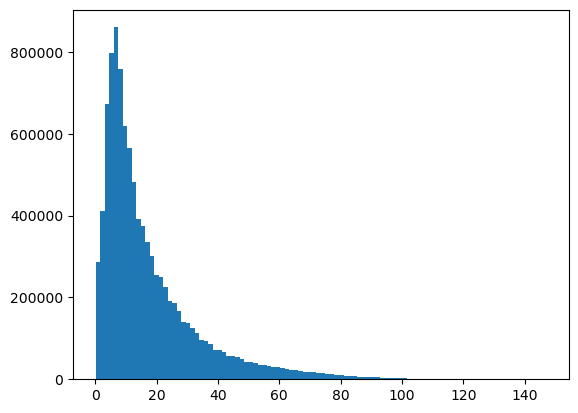

In [17]:
import matplotlib.pyplot as plt
plt.hist(vals.flatten(),bins=100)

(array([5.36700e+03, 1.01090e+04, 1.19170e+04, 1.40980e+04, 1.68080e+04,
        2.01840e+04, 3.24240e+04, 2.99360e+04, 3.65390e+04, 5.58940e+04,
        6.69320e+04, 7.90600e+04, 9.18890e+04, 1.04537e+05, 1.17270e+05,
        1.50716e+05, 1.42549e+05, 1.77889e+05, 1.90457e+05, 2.28674e+05,
        2.16162e+05, 2.52340e+05, 2.87982e+05, 2.71471e+05, 3.06177e+05,
        3.39205e+05, 3.45806e+05, 3.48049e+05, 3.60052e+05, 3.42050e+05,
        3.39328e+05, 3.28410e+05, 3.04022e+05, 2.95046e+05, 2.85268e+05,
        2.65711e+05, 2.67258e+05, 2.47787e+05, 2.42527e+05, 2.25218e+05,
        2.05016e+05, 1.84560e+05, 1.68673e+05, 1.52127e+05, 1.34897e+05,
        1.21758e+05, 1.09769e+05, 9.70080e+04, 8.68490e+04, 7.47390e+04,
        6.41950e+04, 5.54190e+04, 4.57900e+04, 3.68800e+04, 2.85420e+04,
        2.06240e+04, 1.37260e+04, 8.66600e+03, 5.01600e+03, 2.99300e+03,
        1.78300e+03, 1.00700e+03, 5.29000e+02, 2.13000e+02, 8.20000e+01,
        2.70000e+01, 1.80000e+01, 1.10000e+01, 6.00

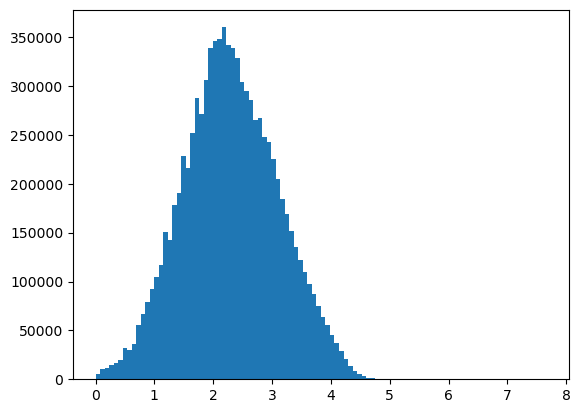

In [ ]:
plt.hist(madrigal_dataset.tec.numpy()*TEC_STD_LOG1P+TEC_MEAN_LOG1P, bins=100)

In [33]:
df_jpl.columns

Index(['JPLD__vTEC_lat-89.5_lon0.50__[TECU]',
       'JPLD__vTEC_lat-63.5_lon137.50__[TECU]',
       'JPLD__vTEC_lat-51.5_lon-84.50__[TECU]',
       'JPLD__vTEC_lat-42.5_lon52.50__[TECU]',
       'JPLD__vTEC_lat-35.5_lon-169.50__[TECU]',
       'JPLD__vTEC_lat-28.5_lon-32.50__[TECU]',
       'JPLD__vTEC_lat-21.5_lon104.50__[TECU]',
       'JPLD__vTEC_lat-15.5_lon-117.50__[TECU]',
       'JPLD__vTEC_lat-9.5_lon20.50__[TECU]',
       'JPLD__vTEC_lat-3.5_lon157.50__[TECU]',
       'JPLD__vTEC_lat3.5_lon-64.50__[TECU]',
       'JPLD__vTEC_lat9.5_lon72.50__[TECU]',
       'JPLD__vTEC_lat15.5_lon-149.50__[TECU]',
       'JPLD__vTEC_lat21.5_lon-12.50__[TECU]',
       'JPLD__vTEC_lat28.5_lon124.50__[TECU]',
       'JPLD__vTEC_lat35.5_lon-97.50__[TECU]',
       'JPLD__vTEC_lat42.5_lon40.50__[TECU]',
       'JPLD__vTEC_lat51.5_lon177.50__[TECU]',
       'JPLD__vTEC_lat63.5_lon-44.50__[TECU]',
       'JPLD__vTEC_lat89.5_lon179.50__[TECU]', 'all__dates_datetime__'],
      dtype='object')

In [31]:
np.log1p(vals).mean(axis=0), np.log1p(vals).std(axis=0)

(array([1.82074894, 2.03593447, 2.44927437, 2.12477278, 2.57671066,
        2.5765731 , 2.5846858 , 3.11953188, 2.92810655, 3.07963392,
        3.09775898, 3.0432291 , 3.04868234, 3.04856726, 2.90664915,
        2.44766219, 2.57009281, 2.2777139 , 1.98237803, 1.93962009]),
 array([0.8254521 , 0.82877583, 0.61760879, 0.87921341, 0.54048259,
        0.85077482, 0.65121051, 0.75129344, 0.76964781, 0.71525215,
        0.74826678, 0.77484779, 0.78324855, 0.76795814, 0.6322272 ,
        0.60900255, 0.52472718, 0.59857223, 0.69552991, 0.72875652]))

In [34]:
# import matplotlib.pyplot as plt

# for i in range(vals.shape[1]):
#     plt.figure(figsize=(10, 5))
#     plt.title(f"Histogram of JPLD VTEC values for column {i}")
#     plt.xlabel("Value")
#     plt.ylabel("Frequency")
#     plt.hist(vals[:, i], bins=100,alpha=0.4,)
#     plt.show()


In [ ]:
### Steps:


# predicted_quantiles = tft(input)
# gt_quantiles = (based on mu+sigma, mu, mu-sigma)
# calculate Q-loss / Q-risk?
# or KL ? Or Wasserstein distance?

# how about the negative log-likehood
# 

# Inputs Tests


## OMNI
Let's start with OMNI.

We construct the dataset with two different resolutions, the one native of OMNI (1min) and another one (15min)


In [21]:
bucket_path='/home/ga00693/gcs-bucket/'
config={'madrigal_path': f'{bucket_path}/madrigal_data/processed/gps_data_tarr/csv_subsets/subset_tec_10mln.csv',
        'set_sw_path': None,#f'{bucket_path}/karman-2025/data/sw_data/set_sw.csv',
        'celestrack_path': None,#f'{bucket_path}/karman-2025/data/sw_data/celestrack_sw.csv',
        'omni_indices_path': f'{bucket_path}/karman-2025/data/omniweb_data/merged_omni_indices.csv',
        'omni_magnetic_field_path': f'{bucket_path}/karman-2025/data/omniweb_data/merged_omni_magnetic_field.csv',
        'omni_solar_wind_path': f'{bucket_path}/karman-2025/data/omniweb_data/merged_omni_solar_wind.csv',
        'use_celestrack': True,
        'use_set_sw': True,
        'use_omni_indices': True,
        'use_omni_magnetic_field': True,
        'use_omni_solar_wind': True,
        'lag_days_proxies':81, # days
        'proxies_resolution':1,  # days
        'lag_minutes_omni':2 * 24 * 60, #minutes
        'omni_resolution':1,  # minutes
}
madrigal_dataset = MadrigalDatasetTimeSeries(config,
                                             torch_type=torch.float32, 
                                             normalize=True)

Loading Madrigal dataset with config:
 {'madrigal_path': '/home/ga00693/gcs-bucket//madrigal_data/processed/gps_data_tarr/csv_subsets/subset_tec_10mln.csv', 'set_sw_path': None, 'celestrack_path': None, 'omni_indices_path': '/home/ga00693/gcs-bucket//karman-2025/data/omniweb_data/merged_omni_indices.csv', 'omni_magnetic_field_path': '/home/ga00693/gcs-bucket//karman-2025/data/omniweb_data/merged_omni_magnetic_field.csv', 'omni_solar_wind_path': '/home/ga00693/gcs-bucket//karman-2025/data/omniweb_data/merged_omni_solar_wind.csv', 'use_celestrack': True, 'use_set_sw': True, 'use_omni_indices': True, 'use_omni_magnetic_field': True, 'use_omni_solar_wind': True, 'lag_days_proxies': 81, 'proxies_resolution': 1, 'lag_minutes_omni': 2880, 'omni_resolution': 1}
Madrigal data loaded with shape: (10000000, 5)
Now removing 0 TEC values...
Madrigal data processed, final shape: (9998211, 5)
Input features shape: torch.Size([9998211, 7])
Loading Omni indices.

Loading time series data for omni_indic

In [78]:
def process_omni(df):

    #let's also load the original omni datasets
    # df = pd.read_csv(config["omni_indices_path"])
    #let's replace the -np.inf and np.inf and ffill of 1 min
    df = df.replace([np.inf, -np.inf], None)
    df = df.dropna()
    df.index = pd.to_datetime(df["all__dates_datetime__"])
    df.sort_index(inplace=True)
    df = df.drop(columns=["all__dates_datetime__", "source__gaps_flag__"], axis=1)
    df = (df.resample(f"{config["omni_resolution"]}min").ffill())
    return df

def process_sw(df):
    
    #let's also load the original omni datasets
    # df = pd.read_csv(config["set_sw_path"])
    #let's replace the -np.inf and np.inf and ffill of 1 day
    df = df.replace([np.inf, -np.inf], None)
    df = df.dropna()
    df.index = pd.to_datetime(df["all__dates_datetime__"])
    df.sort_index(inplace=True)
    df = df.drop(columns=["all__dates_datetime__"], axis=1)
    df = (df.resample(f"{config["proxies_resolution"]}D").ffill())
    return df

df_omni_indices = process_omni(pd.read_csv(config["omni_indices_path"]))
#let's get rid of the AE/etc. indices:
df_omni_indices.drop(columns=["omniweb__ae_index__[nT]", "omniweb__al_index__[nT]", "omniweb__au_index__[nT]"], axis=1, inplace=True)
df_omni_solar_wind = process_omni(pd.read_csv(config["omni_solar_wind_path"]))
df_omni_magnetic_field = process_omni(pd.read_csv(config["omni_magnetic_field_path"]))

# df_celestrack = process_sw(pd.read_csv(config["celestrack_path"]))
# df_set_sw = process_sw(pd.read_csv(config["set_sw_path"]))

In [79]:
#let's pick 4 random indices + the first one:
idxs=np.random.choice(len(madrigal_dataset), size=50, replace=False)
idxs=np.append(idxs, 0)

In [ ]:
for idx in idxs:
    #let's now start the tests:
    sample = madrigal_dataset[idx]

    date= pd.to_datetime(sample['date'])
    inputs = sample['inputs'].numpy()
    omni_indices=sample['omni_indices'].numpy()
    omni_solar_wind=sample['omni_solar_wind'].numpy()
    omni_magnetic_field=sample['omni_magnetic_field'].numpy()
    date_lagged = date - pd.Timedelta(minutes=madrigal_dataset.time_series_data['omni_indices']['lag'])

    idx_start= madrigal_dataset.date_to_index(date=date,
                                date_start=madrigal_dataset.time_series_data["omni_indices"]["date_start"],
                                resolution_seconds=madrigal_dataset.time_series_data["omni_indices"]["resolution"] * 60)
    idx_lagged = madrigal_dataset.date_to_index(date=date_lagged,
                                date_start=madrigal_dataset.time_series_data["omni_indices"]["date_start"],
                                resolution_seconds=madrigal_dataset.time_series_data["omni_indices"]["resolution"] * 60)
    # print(f"Date: {date}, Lagged Date: {date_lagged}")
    subset_indices=df_omni_indices.values[idx_lagged : (idx_start + 1), :]

    date_lagged = date - pd.Timedelta(minutes=madrigal_dataset.time_series_data['omni_magnetic_field']['lag'])

    idx_start= madrigal_dataset.date_to_index(date=date,
                                date_start=madrigal_dataset.time_series_data["omni_magnetic_field"]["date_start"],
                                resolution_seconds=madrigal_dataset.time_series_data["omni_magnetic_field"]["resolution"] * 60)
    idx_lagged = madrigal_dataset.date_to_index(date=date_lagged,
                                date_start=madrigal_dataset.time_series_data["omni_magnetic_field"]["date_start"],
                                resolution_seconds=madrigal_dataset.time_series_data["omni_magnetic_field"]["resolution"] * 60)
    # print(f"Date: {date}, Lagged Date: {date_lagged}")
    subset_magnetic_field=df_omni_magnetic_field.values[idx_lagged : (idx_start + 1), :]

    date_lagged = date - pd.Timedelta(minutes=madrigal_dataset.time_series_data['omni_solar_wind']['lag'])

    idx_start= madrigal_dataset.date_to_index(date=date,
                                date_start=madrigal_dataset.time_series_data["omni_solar_wind"]["date_start"],
                                resolution_seconds=madrigal_dataset.time_series_data["omni_solar_wind"]["resolution"] * 60)
    idx_lagged = madrigal_dataset.date_to_index(date=date_lagged,
                                date_start=madrigal_dataset.time_series_data["omni_solar_wind"]["date_start"],
                                resolution_seconds=madrigal_dataset.time_series_data["omni_solar_wind"]["resolution"] * 60)
    # print(f"Date: {date}, Lagged Date: {date_lagged}")
    subset_solar_wind=df_omni_solar_wind.values[idx_lagged : (idx_start + 1), :]


    #let's unnormalize:
    omni_unnormalized_indices = madrigal_dataset.time_series_data['omni_indices']['scaler'].inverse_transform(omni_indices)
    omni_unnormalized_magnetic_field = madrigal_dataset.time_series_data['omni_magnetic_field']['scaler'].inverse_transform(omni_magnetic_field)
    omni_unnormalized_solar_wind = madrigal_dataset.time_series_data['omni_solar_wind']['scaler'].inverse_transform(omni_solar_wind)

    print("Does the test pass?")
    test_pass_1=np.allclose(omni_unnormalized_indices, subset_indices, atol=1e-4)
    #how much of max error?
    max_err_1=np.abs(omni_unnormalized_indices-subset_indices).max()
    test_pass_2=np.allclose(omni_unnormalized_magnetic_field, subset_magnetic_field, atol=1e-4)
    max_err_2=np.abs(omni_unnormalized_magnetic_field-subset_magnetic_field).max()
    test_pass_3=np.allclose(omni_unnormalized_solar_wind, subset_solar_wind, atol=1e-4)
    max_err_3=np.abs(omni_unnormalized_solar_wind-subset_solar_wind).max()
    argmax_err_3=np.argmax(np.abs(omni_unnormalized_solar_wind-subset_solar_wind))
    if test_pass_1 and test_pass_2 and test_pass_3:
        print("Test passed!")
    else:
        print("Test failed!")
        #max errors:
        print(f"Max error indices: {max_err_1}, magnetic field: {max_err_2}, solar wind: {max_err_3}")
        print(f"Difference of solar winds: {sorted(np.abs(omni_unnormalized_solar_wind - subset_solar_wind).flatten(),reverse=True)}")
        print(f"which solar wind values? {omni_unnormalized_solar_wind.flatten()[argmax_err_3]}, {subset_solar_wind.flatten()[argmax_err_3]}")
        print(f"Date: {date}, Lagged Date: {date_lagged}")
        print(test_pass_1, test_pass_2, test_pass_3)
        print("\n")
        # print("Omni indices unnormalized:", omni_unnormalized_indices)
        # print("Subset indices:", subset_indices)
        # print("max difference:", np.max(np.abs(omni_unnormalized_indices - subset_indices[:, :])))
        # print("min difference:", np.min(np.abs(omni_unnormalized_indices - subset_indices[:, :])))
        # print("where max:", omni_unnormalized_indices.flatten()[np.argmax(np.abs(omni_unnormalized_indices - subset_indices))],subset_indices.flatten()[np.argmax(np.abs(omni_unnormalized_indices - subset_indices))])

Does the test pass?
Test failed!
Max error indices: 7.62939453125e-06, magnetic field: 6.675720216620107e-07, solar wind: 0.014184570312522737
Difference of solar winds: [np.float64(0.014184570312522737), np.float64(0.014184570312522737), np.float64(0.013476562500045475), np.float64(0.013281249999977263), np.float64(0.013269042968772737), np.float64(0.013269042968772737), np.float64(0.013269042968772737), np.float64(0.013269042968772737), np.float64(0.013049316406295475), np.float64(0.013049316406295475), np.float64(0.013049316406295475), np.float64(0.012902832031272737), np.float64(0.0128173828125), np.float64(0.012780761718772737), np.float64(0.012731933593727263), np.float64(0.012731933593727263), np.float64(0.012646484374954525), np.float64(0.012646484374954525), np.float64(0.012646484374954525), np.float64(0.012646484374954525), np.float64(0.012622070312545475), np.float64(0.0125732421875), np.float64(0.012524414062454525), np.float64(0.012524414062454525), np.float64(0.0125122070

In [175]:
subset_magnetic_field.shape

(2881, 6)

In [167]:
omni_magnetic_field.shape

(2881, 3)

In [147]:
madrigal_dataset[0]['omni_']

{'date': np.datetime64('2009-12-31T00:07:30.000000000'),
 'inputs': tensor([-0.0172,  0.9999,  0.0327,  0.9995,  0.4667, -0.9703,  0.2419]),
 'tec': tensor(-1.0749),
 'dtec': tensor(0.5000),
 'omni_indices': tensor([[-2.1177,  1.5224, -1.6561, -0.8103,  0.1085, -1.1230],
         [-2.2173,  1.6155, -1.6561, -0.8103,  0.1085, -1.1230],
         [-2.1177,  1.6155, -1.5472, -0.8103,  0.1085, -1.1230],
         ...,
         [-2.8627,  2.2784, -1.6561, -0.3408,  0.9946, -1.8370],
         [-2.6606,  2.2784, -1.5472, -0.3408,  0.9946, -1.8370],
         [-2.6606,  2.2784, -1.5472, -0.3408,  0.9946, -1.8370]]),
 'omni_solar_wind': tensor([[-1.0749,  1.0651,  0.6102, -0.0664],
         [-1.1186,  1.1116,  0.7804,  0.0396],
         [-1.0773,  1.0684,  0.6144, -0.4426],
         ...,
         [-2.1236,  2.1137,  0.1967, -0.3327],
         [-2.1026,  2.0802,  0.1614, -0.2474],
         [-2.1026,  2.0802,  0.1614, -0.2474]]),
 'omni_magnetic_field': tensor([[-0.3855, -0.5140,  0.0233],
         

True

In [136]:
# for i in range(sample['omni_indices'].shape[0]):
#     #check if one of the row element is NaN:
#     if np.isnan(sample['omni_indices'][i]).any():
#         print(f"Row {i} in sample['omni_indices'] contains NaN values.")
#     else:
#         continue


/var/tmp/ipykernel_350280/4286513159.py:3: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  if np.isnan(sample['omni_indices'][i]).any():


In [114]:
np.max(omni_unnormalized_indices)

np.float32(nan)

False

In [68]:
subset_indices[:,1:]

array([[651.0, -419.0, 232.0, ..., -16, 29, 0],
       [620.0, -391.0, 229.0, ..., -16, 27, 0],
       [618.0, -392.0, 226.0, ..., -16, 24, 0],
       ...,
       [35.0, -15.0, 20.0, ..., -11, 6, 0],
       [40.0, -19.0, 21.0, ..., -11, 7, 0],
       [43.0, -21.0, 22.0, ..., -11, 7, 0]], shape=(2881, 7), dtype=object)

In [57]:
subset_indices

array([['2010-09-26 22:51:00', 40.0, -19.0, 21.0, 1, -11, 7, 0],
       ['2010-09-26 22:52:00', 43.0, -21.0, 22.0, 1, -11, 7, 0]],
      dtype=object)

In [41]:
subset_indices, idx_lagged, idx_start

(array([], shape=(0, 6), dtype=float32), 6000502, 6003382)

In [32]:
sample

{'date': np.datetime64('2012-02-29T21:07:30.000000000'),
 'inputs': tensor([ 0.8498,  0.5271, -0.6836,  0.7299,  0.6000, -0.9848, -0.1736]),
 'tec': tensor(0.7936),
 'dtec': tensor(1.9000),
 'omni_indices': tensor([[ 0.3398,  1.2369,  1.0642, -0.7953, -1.5623,  0.6815],
         [ 0.2920,  1.2369,  0.9880, -0.7953, -1.5623,  0.7557],
         [ 0.2534,  1.2369,  0.9229, -0.7953, -1.5308,  0.8249],
         ...,
         [-1.0576,  1.1042, -0.8482,  0.1250,  0.3526, -1.3224],
         [-1.0232,  0.8650, -0.9062,  0.1250,  0.3526, -1.3224],
         [-1.0576,  1.0426, -0.9062,  0.1250,  0.3526, -1.3224]]),
 'omni_solar_wind': tensor([[ 0.9472, -0.9314, -0.0423, -2.0407],
         [ 0.8958, -0.8908,  0.0083, -1.6497],
         [ 0.8958, -0.8908,  0.0083, -1.6497],
         ...,
         [ 0.6079, -0.6152, -0.7358,  0.5773],
         [ 0.5853, -0.5898, -0.6405,  0.5773],
         [ 0.5853, -0.5898, -0.6405,  0.5773]]),
 'omni_magnetic_field': tensor([[-2.5487,  2.5644,  0.8672],
         [

In [16]:
date=pd.to_datetime(madrigal_dataset[0]['date'])
date_start = madrigal_dataset.time_series_data['omni_indices']['date_start']

In [23]:
df_omni.iloc[43207-2*24*60]

all__dates_datetime__      2009-12-29 00:07:00
omniweb__ae_index__[nT]                   13.0
omniweb__al_index__[nT]                   -6.0
omniweb__au_index__[nT]                    7.0
omniweb__sym_d__[nT]                        -2
omniweb__sym_h__[nT]                        -7
omniweb__asy_d__[nT]                         8
source__gaps_flag__                          0
Name: 40327, dtype: object

In [114]:
madrigal_dataset.time_series_data['omni_indices']["scaler"].n_features_in_

1

In [98]:
vv=list(madrigal_dataset.time_series_data['omni_indices']["features_names"])

In [22]:
madrigal_dataset.time_series_data['omni_indices']["scaler"].inverse_transform(madrigal_dataset[0]['omni_indices'].numpy())

array([[13., -6.,  7., -2., -7.,  8.],
       [12., -5.,  7., -2., -7.,  8.],
       [13., -5.,  8., -2., -7.,  8.],
       ...,
       [ 7.,  0.,  7., -1.,  2.,  5.],
       [ 8.,  0.,  8., -1.,  2.,  5.],
       [ 8.,  0.,  8., -1.,  2.,  5.]], shape=(2881, 6), dtype=float32)

In [20]:
madrigal_dataset[0]['omni_indices']

tensor([[-2.1519,  1.5615, -1.6229, -0.7953,  0.1003, -1.1162],
        [-2.2539,  1.6556, -1.6229, -0.7953,  0.1003, -1.1162],
        [-2.1519,  1.6556, -1.5101, -0.7953,  0.1003, -1.1162],
        ...,
        [-2.8861,  2.3595, -1.6229, -0.3284,  1.0238, -1.8223],
        [-2.7265,  2.3595, -1.5101, -0.3284,  1.0238, -1.8223],
        [-2.7265,  2.3595, -1.5101, -0.3284,  1.0238, -1.8223]])

In [18]:
df_omni.iloc[43207]

all__dates_datetime__      2009-12-31 00:07:00
omniweb__ae_index__[nT]                    8.0
omniweb__al_index__[nT]                    0.0
omniweb__au_index__[nT]                    8.0
omniweb__sym_d__[nT]                        -1
omniweb__sym_h__[nT]                         2
omniweb__asy_d__[nT]                         5
source__gaps_flag__                          0
Name: 43207, dtype: object

In [17]:
resolution_seconds=60
madrigal_dataset.date_to_index(date=date,
                               date_start=date_start,
                               resolution_seconds=resolution_seconds)

43207

In [25]:
madrigal_dataset.time_series_data['set_sw']['data']

torch.Size([10512, 9])

In [22]:
madrigal_dataset[10000]

943 895
943 895
943 895
6849067 6848986
27494347 27494266


{'date': np.datetime64('2010-01-09T07:07:30.000000000'),
 'inputs': tensor([ 0.1373,  0.9905,  0.9569, -0.2903, -0.1556, -0.8480,  0.5299]),
 'tec': tensor(-0.6891),
 'dtec': tensor(2.5000),
 'omni_indices': tensor([[-1.6536,  2.3867, -0.4849,  0.5278,  0.5107, -1.5160],
         [-2.5034,  2.0198, -1.5431,  0.5278,  0.7054, -1.0989],
         [-2.7477,  1.7762, -2.0227,  0.1288,  0.7919, -2.4676],
         [-5.1993,  1.8941, -2.4572,  0.5278,  0.9821, -2.9026],
         [-2.8861,  1.6685, -2.3026,  0.5278,  1.0852, -2.0890],
         [-3.0485,  1.7762, -2.3026,  0.1288,  1.2915, -1.7695],
         [-2.5034,  1.3825, -2.3026, -0.3408,  1.0852, -1.0989],
         [-2.2734,  1.3825, -2.0227, -0.3408,  1.0852, -1.2965],
         [-2.5034,  1.7762, -1.7701, -0.8159,  0.8834, -1.5160],
         [-2.1674,  1.4720, -1.7701, -0.3408,  0.7054, -0.7629],
         [-1.9972,  1.3023, -1.7701,  0.5278,  0.7054, -0.6158],
         [-2.0759,  1.2342, -2.0227,  0.1288,  0.6115, -2.0890],
         [-1.

In [45]:
madrigal_dataset.time_series_data

544 μs ± 4.69 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [42]:
df_sw=pd.read_csv(config['set_sw_path'])

In [47]:
df_sw.index = pd.to_datetime(df_sw['all__dates_datetime__'])
df_sw = df_sw.sort_index()

In [49]:
df_sw.resample(f"{1}D").ffill()

,all__dates_datetime__,space_environment_technologies__f107_obs__,space_environment_technologies__f107_average__,space_environment_technologies__s107_obs__,space_environment_technologies__s107_average__,space_environment_technologies__m107_obs__,space_environment_technologies__m107_average__,space_environment_technologies__y107_obs__,space_environment_technologies__y107_average__,JB08__d_st_dt__[K]
all__dates_datetime__,,,,,,,,,,
1997-01-01,1997-01-01,174.2,165.8,147.9,136.4,179.7,153.3,179.5,168.2,44.0
1997-01-02,1997-01-02,72.4,78.0,74.0,79.2,180.1,152.6,176.7,168.5,31.0
1997-01-03,1997-01-03,72.1,77.9,73.8,79.1,65.4,73.8,174.5,168.8,24.0
1997-01-04,1997-01-04,73.3,77.6,75.0,79.1,66.9,73.7,174.2,169.0,31.0
1997-01-05,1997-01-05,73.8,77.3,76.3,79.0,70.1,73.6,175.1,169.4,38.0
...,...,...,...,...,...,...,...,...,...,...
2025-10-08,2025-10-08,159.0,162.5,149.0,138.0,192.1,156.4,175.6,167.0,0.0
2025-10-09,2025-10-09,163.2,163.1,147.0,137.8,189.6,156.0,176.4,167.2,0.0
2025-10-10,2025-10-10,169.1,163.7,145.9,137.6,186.0,155.6,177.6,167.4,0.0


In [44]:
df_sw.resample(f'{1}D').ffill(inplace=True)

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'

In [37]:
df_omni=pd.read_csv(config['omni_indices_path'])

In [41]:
df_omni.iloc[943]

all__dates_datetime__      2009-12-01 15:43:00
omniweb__ae_index__[nT]                   10.0
omniweb__al_index__[nT]                  -10.0
omniweb__au_index__[nT]                    0.0
omniweb__sym_d__[nT]                         0
omniweb__sym_h__[nT]                         0
omniweb__asy_d__[nT]                         6
source__gaps_flag__                          0
Name: 943, dtype: object

In [34]:
madrigal_dataset[0]

720 672
720 672
720 672
6835687 6835606
27480967 27480886


{'date': np.datetime64('2009-12-31T00:07:30.000000000'),
 'inputs': tensor([-0.0172,  0.9999,  0.0327,  0.9995,  0.4667, -0.9703,  0.2419]),
 'tec': tensor(-1.0749),
 'dtec': tensor(0.5000),
 'omni_indices': tensor([[-2.1570,  1.5035, -1.6319, -0.7905,  0.1069, -1.1134],
         [-1.9017,  1.3309, -1.5369, -1.1440, -0.1285, -1.3073],
         [-2.0684,  1.7039, -1.1883, -0.3184, -0.0513, -1.7737],
         [-2.4275,  1.8138, -1.6319, -0.3184, -0.0513, -1.3073],
         [-2.2603,  1.8138, -1.4487, -0.7905,  0.1069, -1.3073],
         [-3.0757,  1.9268, -2.1583, -1.1440, -0.0513, -1.1134],
         [-2.5302,  1.8138, -1.7460, -0.7905, -0.0513, -1.5204],
         [-2.7762,  1.9268, -1.8727, -0.3184, -0.0513, -1.7737],
         [-1.6338,  1.6008, -0.7721, -0.7905,  0.1069, -2.0835],
         [-0.2541,  0.0212, -0.4652, -1.1440,  0.3536, -1.5204],
         [-1.5304,  1.4142, -0.7721, -1.1440,  0.4445, -1.7737],
         [-1.7588,  1.4142, -0.9889, -0.3184,  0.6376, -1.5204],
         [-2.

In [16]:
madrigal_dataset[0]['date']

np.datetime64('2009-12-31T00:07:30.000000000')

In [21]:
madrigal_dataset.time_series_data['celestrack']

{'data': tensor([[-1.3306],
         [-0.9196],
         [-1.9098],
         ...,
         [ 0.5256],
         [-0.1201],
         [-0.3403]]),
 'date_start': Timestamp('2009-10-12 00:00:00'),
 'column_names': Index(['celestrack__ap_average__'], dtype='object'),
 'features_names': ['celestrack__ap_average___log1p_normalized'],
 'lag': 81,
 'resolution': 1}

In [24]:
pd.to_datetime(madrigal_dataset[0]['date']) - pd.Timedelta(minutes=data["lag"])

Timestamp('2009-12-30 22:46:30')

In [49]:
data["resolution"],data["lag"]

(1, 81)

In [54]:
pd.to_datetime(madrigal_dataset[1000]['date'])

Timestamp('2010-01-01 01:47:30')

In [30]:
import math
for data_name, data in madrigal_dataset.time_series_data.items():
    print(data_name)
    now_index = madrigal_dataset.date_to_index(
                                    date=pd.to_datetime(madrigal_dataset[5000]['date']),
                                    date_start=data["date_start"],
                                    delta_seconds=data["resolution"] * 60 if "omni" in data_name else data["resolution"] * 24 * 3600
                                )

    lagged_index = madrigal_dataset.date_to_index(date=pd.to_datetime(madrigal_dataset[5000]['date']) - pd.Timedelta(minutes=data["lag"]) if "omni" in data_name else pd.to_datetime(madrigal_dataset[5000]['date']) - pd.Timedelta(days=data["lag"]),
                                        date_start=data["date_start"],
                                        delta_seconds=data["resolution"] * 60 if "omni" in data_name else data["resolution"] * 24 * 3600)
    print(lagged_index, now_index)
    print(pd.to_datetime(madrigal_dataset[5000]['date'])-pd.Timedelta(minutes=data["lag"]) if "omni" in data_name else pd.to_datetime(madrigal_dataset[5000]['date']) - pd.Timedelta(days=data["lag"]))


omni_indices
803 755
803 755
803 755
6840677 6840596
27485957 27485876
803 755
803 755
803 755
6840677 6840596
27485957 27485876
755 803
803 755
803 755
803 755
6840677 6840596
27485957 27485876
2010-01-01 11:17:30
omni_solar_wind
803 755
803 755
803 755
6840677 6840596
27485957 27485876
803 755
803 755
803 755
6840677 6840596
27485957 27485876
755 803
803 755
803 755
803 755
6840677 6840596
27485957 27485876
2010-01-01 11:17:30
omni_magnetic_field
803 755
803 755
803 755
6840677 6840596
27485957 27485876
803 755
803 755
803 755
6840677 6840596
27485957 27485876
755 803
803 755
803 755
803 755
6840677 6840596
27485957 27485876
2010-01-01 11:17:30
set_sw
803 755
803 755
803 755
6840677 6840596
27485957 27485876
803 755
803 755
803 755
6840677 6840596
27485957 27485876
4669 4750
803 755
803 755
803 755
6840677 6840596
27485957 27485876
2009-10-14 11:17:30
celestrack
803 755
803 755
803 755
6840677 6840596
27485957 27485876
803 755
803 755
803 755
6840677 6840596
27485957 27485876
19006 1

In [31]:
data["date_start"]

Timestamp('1957-10-01 00:00:00')

In [70]:
date_lagged=pd.to_datetime(madrigal_dataset[1000]['date'])-pd.Timedelta(days=data["lag"])
date_start=data["date_start"]

(date_lagged-date_start)

Timedelta('0 days 01:47:30')

In [74]:
date_lagged, date_start, madrigal_dataset[1000], data["lag"]

(Timestamp('2009-10-12 01:47:30'),
 Timestamp('2009-10-12 00:00:00'),
 {'ap_average': tensor(12.),
  'date': np.datetime64('2010-01-01T01:47:30.000000000'),
  'inputs': tensor([ 0.0000,  1.0000,  0.4520,  0.8920,  0.5222, -0.9455, -0.3256]),
  'tec': tensor(-0.8909),
  'dtec': tensor(0.5000),
  'solar_activity_classification': 'F10.7: 150-200 (moderate-high)',
  'storm_classification': 'G0'},
 81)

In [56]:
data["date_start"], data["resolution"], data["lag"]

(Timestamp('2009-10-12 00:00:00'), 1, 81)

In [1]:
%debug

ERROR:root:No traceback has been produced, nothing to debug.


In [51]:
madrigal_dataset.time_series_data

AttributeError: 'MadrigalDataset' object has no attribute 'time_series_data'

Text(0.5, 1.0, 'Total Electron Content (TEC) and its Rate of Change (dTEC)')

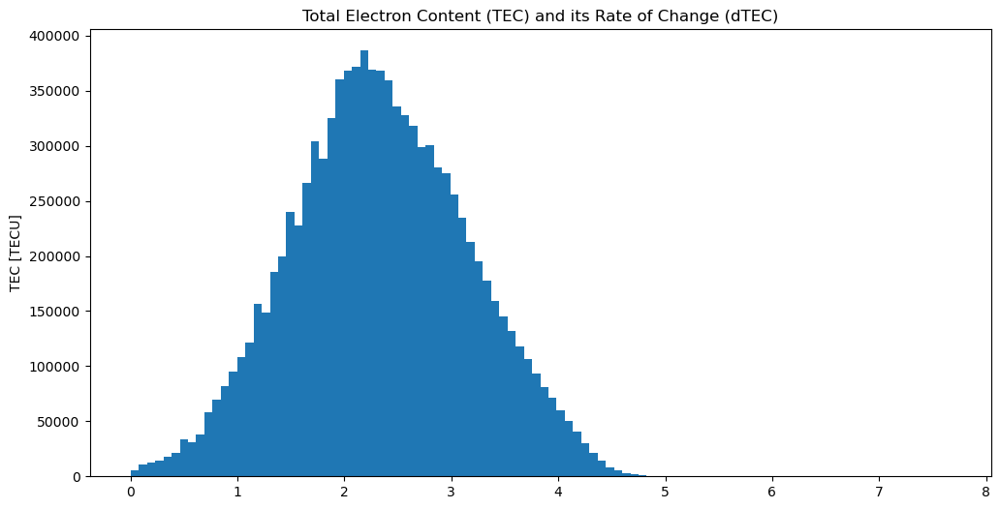

In [ ]:
tec=madrigal_dataset.data['madrigal__tec__[TECU]'].values
dtec=madrigal_dataset.data['madrigal__dtec__[TECU]'].values

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.hist(np.log1p(tec), bins=100)
plt.ylabel('TEC [TECU]')
plt.title('Total Electron Content (TEC)')

In [35]:
tec.max(), tec.min(), tec.mean()

(np.float64(2124.5),
 np.float64(9.999999747378752e-05),
 np.float64(13.540170372944754))

In [171]:
madrigal_dataset.input_features.max(), madrigal_dataset.input_features.min(), len(madrigal_dataset.input_features_names),madrigal_dataset.input_features_names

(tensor(5.1083),
 tensor(-2.9000),
 16,
 ['doy_sin',
  'doy_cos',
  'sid_sin',
  'sid_cos',
  'latitudes_normalized',
  'longitudes_sin',
  'longitudes_cos',
  'space_environment_technologies__f107_obs__log10_normalized',
  'space_environment_technologies__f107_average__log10_normalized',
  'space_environment_technologies__s107_obs__log10_normalized',
  'space_environment_technologies__s107_average__log10_normalized',
  'space_environment_technologies__m107_obs__log10_normalized',
  'space_environment_technologies__m107_average__log10_normalized',
  'space_environment_technologies__y107_obs__log10_normalized',
  'space_environment_technologies__y107_average__log10_normalized',
  'ap_average_log1p_normalized'])

In [ ]:
#(np.float64(4.673353082877473), np.float64(0.3536347837668087)) f
#(np.float64(4.59191155325994), np.float64(0.4031388769719618)) s
#(np.float64(4.694261833578996), np.float64(0.3608190836601623)) m
#(np.float64(4.711398844838459), np.float64(0.3457463405157691))
np.log1p(madrigal_dataset.data['space_environment_technologies__y107_obs__'].values).mean(), np.log1p(madrigal_dataset.data['space_environment_technologies__y107_obs__'].values).std()

(np.float64(4.711398844838459), np.float64(0.3457463405157691))

(array([305045., 903739., 776850.,  90222., 171215., 599321., 267607.,
        194098., 322019., 210926., 230302.,  71024.,  66564.,  85547.,
         89256.,  80090.,  53119., 127582., 107078., 199763., 225292.,
        189511., 220062., 295102., 271336., 263566., 382260., 253561.,
        201841., 133131.,  73369., 161501., 233368., 245199., 376160.,
        339614., 121219., 160663., 190698.,  50194.,  62183.,  56441.,
        126602.,  35040.,  89394.,  70326.,  24084.,  58553.,  45377.,
         91197.]),
 array([-1.1551832 , -1.08473711, -1.01429102, -0.94384492, -0.87339883,
        -0.80295274, -0.73250665, -0.66206056, -0.59161447, -0.52116838,
        -0.45072228, -0.38027619, -0.3098301 , -0.23938401, -0.16893792,
        -0.09849183, -0.02804574,  0.04240036,  0.11284645,  0.18329254,
         0.25373863,  0.32418472,  0.39463081,  0.46507691,  0.535523  ,
         0.60596909,  0.67641518,  0.74686127,  0.81730736,  0.88775345,
         0.95819955,  1.02864564,  1.09909173,

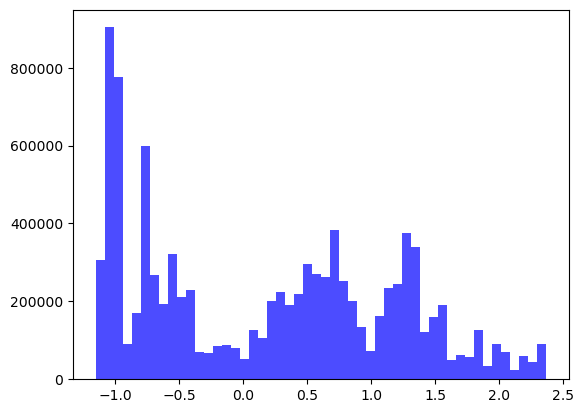

In [132]:
import matplotlib.pyplot as plt

plt.hist((np.log10(madrigal_dataset.data['space_environment_technologies__f107_average__'].values)-2.)/0.15, bins=50, color='blue', alpha=0.7)

In [104]:
madrigal_dataset.data['all__longitudes__[deg]'].max(), madrigal_dataset.data['all__longitudes__[deg]'].min()

(np.int64(179), np.int64(-180))

In [93]:
madrigal_dataset.data['all__dates_datetime__'].dt.dayofyear.max(),madrigal_dataset.data['all__dates_datetime__'].dt.dayofyear.min()


(np.int32(366), np.int32(1))

In [91]:
madrigal_dataset.data['all__dates_datetime__'].dt.dayofyear
#madrigal_dataset.dates.values

0          365
1          365
2          365
3          365
4          365
          ... 
9998206    201
9998207    201
9998208    201
9998209    201
9998210    201
Name: all__dates_datetime__, Length: 9998211, dtype: int32

In [76]:
madrigal_dataset.data['all__latitudes__[deg]'].values.max(),madrigal_dataset.data['all__latitudes__[deg]'].values.min()

(np.int64(89), np.int64(-90))

In [ ]:
madrigal_dataset.data['all__latitudes__[deg]'].values.max(),madrigal_dataset.data['all__latitudes__[deg]'].values.min()

In [ ]:
madrigal_dataset.data.columns

Index(['all__latitudes__[deg]', 'all__longitudes__[deg]',
       'madrigal__tec__[TECU]', 'madrigal__dtec__[TECU]',
       'all__dates_datetime__', 'celestrack__ap_average__',
       'space_environment_technologies__f107_obs__',
       'space_environment_technologies__f107_average__',
       'space_environment_technologies__s107_obs__',
       'space_environment_technologies__s107_average__',
       'space_environment_technologies__m107_obs__',
       'space_environment_technologies__m107_average__',
       'space_environment_technologies__y107_obs__',
       'space_environment_technologies__y107_average__', 'JB08__d_st_dt__[K]',
       'omniweb__ae_index__[nT]', 'omniweb__al_index__[nT]',
       'omniweb__au_index__[nT]', 'omniweb__sym_d__[nT]',
       'omniweb__sym_h__[nT]', 'omniweb__asy_d__[nT]', 'source__gaps_flag___x',
       'omniweb__bx_gse__[nT]', 'omniweb__by_gse__[nT]',
       'omniweb__bz_gse__[nT]', 'source__gaps_flag___y',
       'omniweb__speed__[km/s]', 'omniweb__vx_vel

In [50]:
df_merged = pd.merge_asof(madrigal_data,
                        celestrack_data, 
                        on='all__dates_datetime__', 
                        direction='backward')

In [51]:
df_merged

,all__latitudes__[deg],all__longitudes__[deg],madrigal__tec__[TECU],madrigal__dtec__[TECU],all__dates_datetime__,celestrack__ap_average__
0,25,30,4.900000,0.500000,2009-12-31 00:02:30,0.0
1,62,7,1.800000,1.700000,2009-12-31 00:02:30,0.0
2,65,-171,4.200000,1.100000,2009-12-31 00:02:30,0.0
3,-50,-52,8.100000,2.100000,2009-12-31 00:07:30,0.0
4,31,-107,3.300000,1.000000,2009-12-31 00:07:30,0.0
...,...,...,...,...,...,...
4999109,-84,-124,1.607329,1.362150,2025-07-20 23:52:30,5.0
4999110,24,92,7.472444,0.923046,2025-07-20 23:57:30,5.0
4999111,39,-104,23.894079,0.270174,2025-07-20 23:57:30,5.0
4999112,-30,-59,5.349936,0.585082,2025-07-20 23:57:30,5.0


In [49]:
#let's merge the datasets:
sw_data = pd.merge_asof(celestrack_data,
                            set_sw, 
                            on='all__dates_datetime__', 
                            direction='backward')
df_merged = pd.merge_asof(madrigal_data,
                        sw_data, 
                        on='all__dates_datetime__', 
                        direction='backward')
df_merged = pd.merge_asof(df_merged,
                            omni_indices, 
                            on='all__dates_datetime__', 
                            direction='backward')
df_merged = pd.merge_asof(df_merged,
                            omni_magnetic_field, 
                            on='all__dates_datetime__', 
                            direction='backward')
df_merged = pd.merge_asof(df_merged,
                            omni_solar_wind, 
                            on='all__dates_datetime__', 
                            direction='backward')

KeyboardInterrupt: 

In [2]:
import pandas as pd

data_dir='/home/ga00693/gps_data_tarr/subset_tec_10mln.csv'
df=pd.read_csv(data_dir)  

In [12]:
len(df['madrigal__tec__[TECU]'].values[df['madrigal__tec__[TECU]'].values==0])

1789

In [13]:
mean_log10_tec = np.log10(df['madrigal__tec__[TECU]'].values[df['madrigal__tec__[TECU]'].values>0]).mean()
std_log10_tec = np.log10(df['madrigal__tec__[TECU]'].values[df['madrigal__tec__[TECU]'].values>0]).std()


(array([2.00000e+00, 1.00000e+00, 1.00000e+00, 2.00000e+00, 1.00000e+00,
        2.00000e+00, 4.00000e+00, 2.00000e+00, 4.00000e+00, 5.00000e+00,
        5.00000e+00, 7.00000e+00, 1.10000e+01, 1.00000e+01, 1.70000e+01,
        1.40000e+01, 1.90000e+01, 1.90000e+01, 2.70000e+01, 3.10000e+01,
        3.50000e+01, 4.40000e+01, 4.60000e+01, 7.10000e+01, 7.50000e+01,
        7.90000e+01, 1.07000e+02, 1.19000e+02, 1.34000e+02, 1.61000e+02,
        2.02000e+02, 2.13000e+02, 2.83000e+02, 3.27000e+02, 3.82000e+02,
        4.64000e+02, 5.63000e+02, 7.01000e+02, 7.88000e+02, 9.73000e+02,
        5.12500e+03, 1.38700e+03, 1.70200e+03, 2.05900e+03, 2.54900e+03,
        7.64800e+03, 3.72500e+03, 1.00780e+04, 6.09400e+03, 1.35710e+04,
        1.66930e+04, 2.08650e+04, 2.61450e+04, 4.33140e+04, 4.42610e+04,
        7.12480e+04, 1.08376e+05, 1.19139e+05, 1.89468e+05, 2.05967e+05,
        2.94263e+05, 3.40644e+05, 4.42111e+05, 4.89867e+05, 5.87431e+05,
        6.82061e+05, 7.47267e+05, 7.39406e+05, 6.87

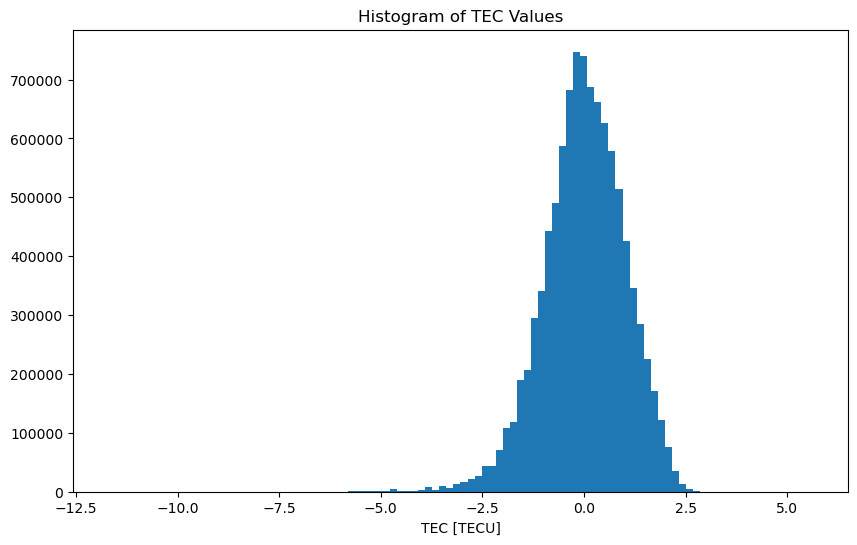

In [14]:
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(10, 6))
plt.title("Histogram of TEC Values")
plt.xlabel("TEC [TECU]")
plt.hist((np.log10(df['madrigal__tec__[TECU]'].values[df['madrigal__tec__[TECU]'].values>0])-mean_log10_tec)/std_log10_tec,bins=100)

In [9]:
df['madrigal__tec__[TECU]'].values.min()

np.float64(0.0)